In [1]:
.libPaths("/home/keionn001/.conda/envs/r-new/lib/R/library")

In [2]:
suppressPackageStartupMessages({
library(purrr)
library(dplyr)
library(tidyverse)
library(ggplot2)
library(scater)
library(slingshot)
library(Seurat)
library(clustree)
library(SeuratWrappers)
library(patchwork)
library(BiocParallel)
library(ggbeeswarm)
library(scry)})

In [3]:
t.cells=readRDS(file="./GSE134577-csf/reclust.t.cells.RDS")

In [4]:
options(repr.plot.width=22, repr.plot.height=10)

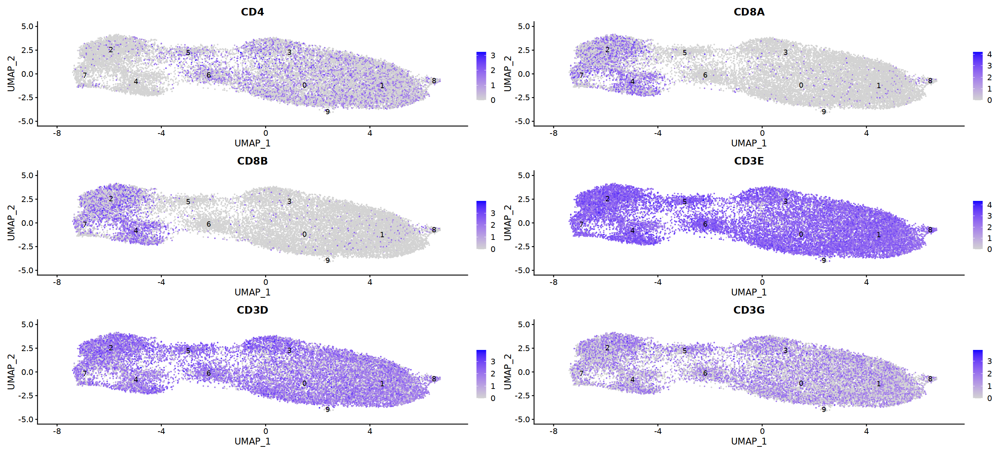

In [5]:
FeaturePlot(t.cells,features=c("CD4","CD8A","CD8B","CD3E","CD3D","CD3G"),label=T)

**subsetting and running trajectory on only CD4 cells.**

**First trajectory is all CD4 cells as they were based on the clustering within t cells from seurat**

In [6]:
Idents(object = t.cells) <- 't.cells.snn_res.0.5'

clust 9 cluster relatively small and only has mito genes enriched as DE in comparison rest of clusters

In [7]:
CD4cells=subset(t.cells,idents = c(2,7,4), invert = T) 

In [8]:
sceCD4 <-  as.SingleCellExperiment(CD4cells,assay="RNA")
options(future.globals.maxSize = 4000 * 1024^2)
#put back the PC and UMAP embeddings
sceCD4@int_colData@listData$reducedDims$UMAP <- CD4cells@reductions$umap@cell.embeddings
sceCD4@int_colData@listData$reducedDims$PCA <- CD4cells@reductions$pca@cell.embeddings

**Eventually we chose all the AD and HC samples for better interpretation**

**Reason is because the condition-specific effects in this datasets are driven mostly by the MCI,
and there is no step wise effect from HC, MCI and AD**

In [9]:
sceCD4=sceCD4[,sceCD4$sampletype%in%c("AD","HC")]

extend=n
dist=mnn: MST based on the distances between mutually nearest neighbors. This avoids penalizing the formation of edges between adjacent heterogeneous clusters. omega=T because clust8 and clust 9

In [10]:
set.seed(8)
sce.sling2 <- slingshot(sceCD4, reducedDim='PCA',cluster="ident",start.clus ="1",extend = 'n',dist.method = "mnn",omega = TRUE)
pseudo.paths <- slingPseudotime(sce.sling2)
head(pseudo.paths)

Warning message in .refine_k(k, precomputed, query = TRUE):
“'k' capped at the number of observations”
Warning message in .refine_k(k, precomputed, query = TRUE):
“'k' capped at the number of observations”
Warning message in .refine_k(k, precomputed, query = TRUE):
“'k' capped at the number of observations”
Warning message in .refine_k(k, precomputed, query = TRUE):
“'k' capped at the number of observations”
Warning message in .refine_k(k, precomputed, query = TRUE):
“'k' capped at the number of observations”
Warning message in .refine_k(k, precomputed, query = TRUE):
“'k' capped at the number of observations”


,Lineage1,Lineage2,Lineage3,Lineage4,Lineage5
HC_HC1_AAACCTGGTTCTGAAC-1,24.69157,26.67403,NA,NA,NA
HC_HC1_AAACGGGAGCCAGAAC-1,NA,NA,35.88112,NA,NA
HC_HC1_AAAGATGAGGGCTTCC-1,12.71030,12.74452,12.74040,12.78348,29.42043
HC_HC1_AAAGATGGTGAACCTT-1,NA,NA,39.09977,NA,NA
HC_HC1_AAAGATGGTTAAGAAC-1,34.98682,NA,31.36852,NA,49.35203
HC_HC1_AAAGTAGAGAGTGAGA-1,14.50531,14.46015,14.76375,14.86626,33.80268


In [11]:
set.seed(8)
reducedDim(sce.sling2, "UMAP") <- reducedDim(sceCD4, "UMAP")
shared.pseudo <- rowMeans(pseudo.paths, na.rm=TRUE)

In [12]:
CD4cells=subset(x = CD4cells, subset = (sampletype == "HC" | sampletype == "AD"))


In [13]:
#QC for the counts cos for all condition it will be 14k counts. 
dim(sceCD4)

[1] 33309 10094

In [14]:

colLabels(sceCD4)=CD4cells@active.ident
clustering <- colLabels(sceCD4)

In [15]:
head(clustering)

HC_HC1_AAACCTGGTTCTGAAC-1 HC_HC1_AAACGGGAGCCAGAAC-1 HC_HC1_AAAGATGAGGGCTTCC-1 
                        0                         3                         1 
HC_HC1_AAAGATGGTGAACCTT-1 HC_HC1_AAAGATGGTTAAGAAC-1 HC_HC1_AAAGTAGAGAGTGAGA-1 
                        3                         5                         1 
Levels: 0 1 3 5 6 8 9

In [16]:
set.seed(8)
clustmap= plotUMAP(sce.sling2, colour_by=I(clustering))

embedded <- embedCurves(sce.sling2, "UMAP")
embedded <- slingCurves(embedded)
for (path in embedded) {
  embedded <- data.frame(path$s[path$ord,])
    clustmap<- clustmap + geom_path(data=embedded, aes(x=UMAP_1, y=UMAP_2), size=1.2)
}

Warning message:
“Using `size` aesthetic for lines was deprecated in ggplot2
3.4.0.
ℹ Please use `linewidth` instead.”


In [17]:
# Need to loop over the paths and HCd each one separately.
set.seed(8)
gg <- plotUMAP(sce.sling2, colour_by=I(shared.pseudo))
embedded <- embedCurves(sce.sling2, "UMAP")
embedded <- slingCurves(embedded)
for (path in embedded) {
    embedded <- data.frame(path$s[path$ord,])
    gg <- gg + geom_path(data=embedded, aes(x=UMAP_1, y=UMAP_2), size=1.2)
}


**Here again that looks like clust 8 is a clear outgroup**

**Also clust 9 looks like an outgroup which doesnt match with the pseudotime**

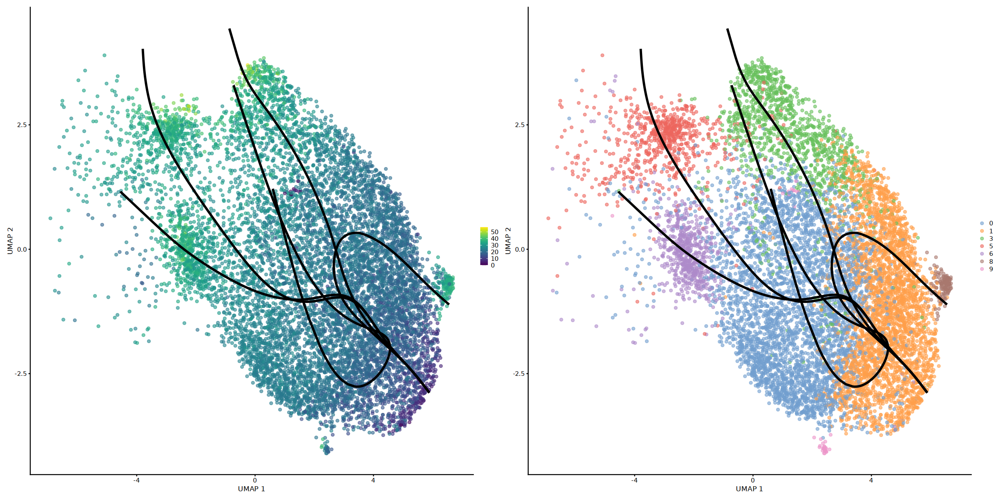

In [18]:
options(repr.plot.width = 20, repr.plot.height = 10)
gg | clustmap

**Clearly here we see 9 branching of 0 at res 0.5**
**therefore we think its a strategy to merge 0 and 9 together**

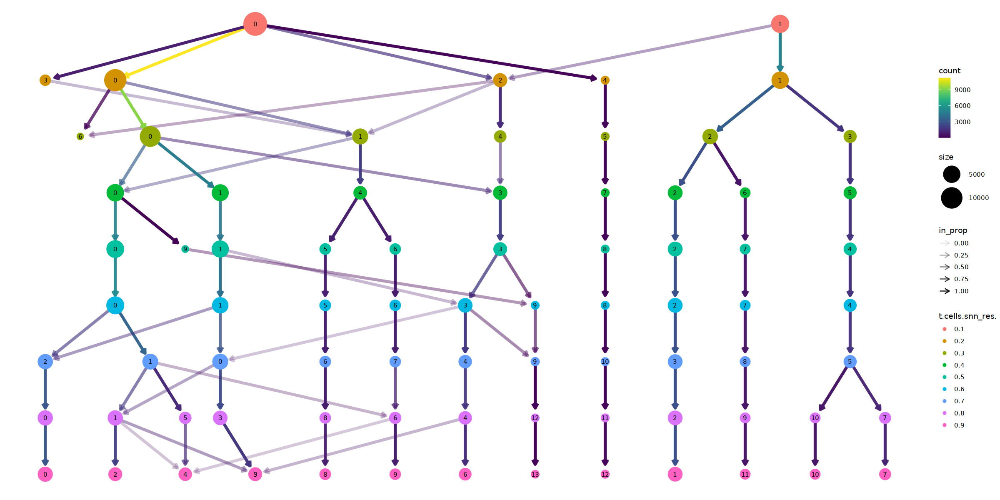

In [19]:
clustree(t.cells, prefix = "t.cells.snn_res.",layout = "sugiyama")

**based on the UMAP proximity- not great but it works, we also decided to merge clust 8 and 1 together**

**Therefore herein thereafter, 
we have merge clust 8 and 1 as a single cluster of clust 1, and clust 0 and 9 as a single clust of clust0** 

In [21]:
CD4cells$old.ident=Idents(CD4cells) #we are stashing the old idents somewhere in the metacol

In [22]:
levels(CD4cells)

[1] "0" "1" "3" "5" "6" "8" "9"

**here subsetting AD and HC**

In [23]:
CD4cells=subset(t.cells,idents = c(2,7,4), invert = T)
CD4cells$old.ident=Idents(CD4cells)
levels(CD4cells)
new_names <- c("0", "1", "3", "5", "6","1","0")
names(new_names) <- levels(CD4cells)

CD4cells <- RenameIdents(object = CD4cells, new_names)
DefaultAssay(t.cells) <- "integrated"
t.cells<- ScaleData(t.cells, verbose = F)



sceCD4 <-  as.SingleCellExperiment(CD4cells,assay="RNA")
sceCD4=sceCD4[,sceCD4$sampletype%in%c("AD","HC")]
CD4cells=subset(x = CD4cells, subset = (sampletype == "HC" | sampletype == "AD"))

[1] "0" "1" "3" "5" "6" "8" "9"

In [24]:
AD_and_HCcells=colnames(sceCD4[sceCD4$sampletype %in% c("AD", "HC"),])

In [25]:
CD4cells@reductions$umap@cell.embeddings[AD_and_HCcells, , drop = FALSE]

,UMAP_1,UMAP_2
HC_HC1_AAACCTGGTTCTGAAC-1,-0.67745226,-1.21665008
HC_HC1_AAACGGGAGCCAGAAC-1,-0.43843126,3.07660799
HC_HC1_AAAGATGAGGGCTTCC-1,4.90884901,-2.19816787
HC_HC1_AAAGATGGTGAACCTT-1,0.44763542,3.58106130
HC_HC1_AAAGATGGTTAAGAAC-1,-1.26984667,2.51982730
HC_HC1_AAAGTAGAGAGTGAGA-1,4.03330923,-2.23602135
HC_HC1_AAAGTAGAGTAGGTGC-1,-3.61990713,2.52149015
HC_HC1_AAAGTAGCAGGTCTCG-1,1.36248756,-0.78406770
HC_HC1_AAATGCCCACACATGT-1,-2.75007057,2.62295406
HC_HC1_AAATGCCCAGACAAAT-1,2.75794864,0.08304160


In [26]:
options(future.globals.maxSize = 4000 * 1024^2)
#put back the PC and UMAP embeddings
# Put back the PC and UMAP embeddings for the subset
sceCD4@int_colData@listData$reducedDims$UMAP <- CD4cells@reductions$umap@cell.embeddings[AD_and_HCcells, , drop = FALSE]
sceCD4@int_colData@listData$reducedDims$PCA <- CD4cells@reductions$pca@cell.embeddings[AD_and_HCcells, , drop = FALSE]

In [27]:
set.seed(8)
sce.sling2 <- slingshot(sceCD4, reducedDim='PCA',cluster="ident",start.clus ="1",extend = 'n',dist.method = "mnn",omega = TRUE)
pseudo.paths <- slingPseudotime(sce.sling2)
head(pseudo.paths)

,Lineage1,Lineage2,Lineage3
HC_HC1_AAACCTGGTTCTGAAC-1,21.919755,23.53871,NA
HC_HC1_AAACGGGAGCCAGAAC-1,NA,NA,32.975091
HC_HC1_AAAGATGAGGGCTTCC-1,8.366536,8.37432,8.424467
HC_HC1_AAAGATGGTGAACCTT-1,NA,NA,35.872273
HC_HC1_AAAGATGGTTAAGAAC-1,32.373279,NA,28.447429
HC_HC1_AAAGTAGAGAGTGAGA-1,11.741672,11.65292,12.114029


In [28]:
set.seed(8)
reducedDim(sce.sling2, "UMAP") <- reducedDim(sceCD4, "UMAP")
shared.pseudo <- rowMeans(pseudo.paths, na.rm=TRUE)

HC_HC1_AAACCTGGTTCTGAAC-1 HC_HC1_AAACGGGAGCCAGAAC-1 HC_HC1_AAAGATGAGGGCTTCC-1 
                        0                         3                         1 
HC_HC1_AAAGATGGTGAACCTT-1 HC_HC1_AAAGATGGTTAAGAAC-1 HC_HC1_AAAGTAGAGAGTGAGA-1 
                        3                         5                         1 
Levels: 0 1 3 5 6

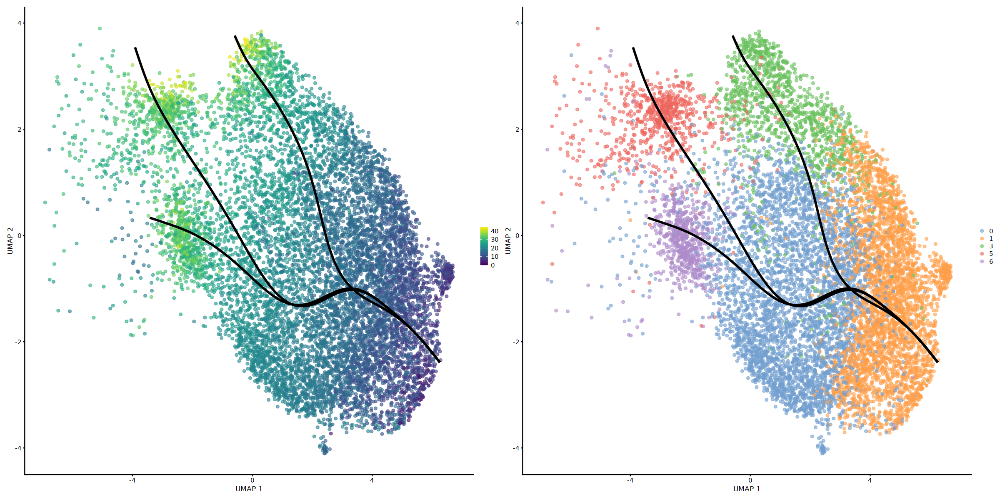

In [29]:
colLabels(sceCD4)=CD4cells@active.ident
clustering <- colLabels(sceCD4)
head(clustering)
set.seed(8)
clustmap= plotUMAP(sce.sling2, colour_by=I(clustering))

embedded <- embedCurves(sce.sling2, "UMAP")
embedded <- slingCurves(embedded)
for (path in embedded) {
  embedded <- data.frame(path$s[path$ord,])
    clustmap<- clustmap + geom_path(data=embedded, aes(x=UMAP_1, y=UMAP_2), size=1.2)
}
# Need to loop over the paths and add each one separately.
set.seed(8)
gg <- plotUMAP(sce.sling2, colour_by=I(shared.pseudo))
embedded <- embedCurves(sce.sling2, "UMAP")
embedded <- slingCurves(embedded)
for (path in embedded) {
    embedded <- data.frame(path$s[path$ord,])
    gg <- gg + geom_path(data=embedded, aes(x=UMAP_1, y=UMAP_2), size=1.2)
}
options(repr.plot.width = 20, repr.plot.height = 10)
gg | clustmap

In [30]:
##QC that the subsetted conditions included are only AD and HC
dim(counts(sce.sling2))
levels(factor(colData(sce.sling2)$sampletype))

[1] 33309 10094

[1] "AD" "HC"

In [47]:
#saveRDS(sce.sling2,file="./GSE134577-csf/subsce.RDS")

**end here the subsetted analysis for AD and HC, proceed to tradeseq**

**Diagnostic plots by order of pseudotime**

In [31]:
names(colData(sce.sling2))

[1] "rowname"                "seq_folder"             "nUMI"                  
 [4] "nGene"                  "mitoratio"              "samplerep"             
 [7] "sampletype"             "log10GenesPerUMI"       "nCount_RNA"            
[10] "nFeature_RNA"           "validCells"             "nCount_SCT"            
[13] "nFeature_SCT"           "graph_res.0.4"          "graph_res.0.5"         
[16] "graph_res.0.6"          "graph_res.0.7"          "graph_res.0.8"         
[19] "graph_res.0.9"          "seurat_clusters"        "SNN.graph_res.0.4"     
[22] "SNN.graph_res.0.5"      "SNN.graph_res.0.6"      "SNN.graph_res.0.7"     
[25] "SNN.graph_res.0.8"      "SNN.graph_res.0.9"      "integrated_snn_res.0.4"
[28] "integrated_snn_res.0.5" "integrated_snn_res.0.6" "integrated_snn_res.0.7"
[31] "integrated_snn_res.0.8" "integrated_snn_res.0.9" "integrated_snn_res.0.1"
[34] "integrated_snn_res.0.2" "integrated_snn_res.0.3" "t.cells.snn_res.0.1"   
[37] "t.cells.snn_res.0.2"    "t.cells.snn_res.0.3"    "t.cells.snn_res.0.4"   
[40] "t.cells.snn_res.0.5"    "t.cells.snn_res.0.6"    "t.cells.snn_res.0.7"   
[43] "t.cells.snn_res.0.8"    "t.cells.snn_res.0.9"    "old.ident"             
[46] "ident"                  "slingshot"              "slingPseudotime_1"     
[49] "slingPseudotime_2"      "slingPseudotime_3"

In [32]:
levels(colData(sce.sling2)$ident)

[1] "0" "1" "3" "5" "6"

In [33]:
df.sce=as.data.frame(colData(sce.sling2)[,c("ident","rowname","slingPseudotime_1","slingPseudotime_2","slingPseudotime_3")])
head(df.sce)
unique(df.sce$ident)

,ident,rowname,slingPseudotime_1,slingPseudotime_2,slingPseudotime_3
,<fct>,<chr>,<dbl>,<dbl>,<dbl>
HC_HC1_AAACCTGGTTCTGAAC-1,0,HC1_AAACCTGGTTCTGAAC-1,21.919755,23.53871,NA
HC_HC1_AAACGGGAGCCAGAAC-1,3,HC1_AAACGGGAGCCAGAAC-1,NA,NA,32.975091
HC_HC1_AAAGATGAGGGCTTCC-1,1,HC1_AAAGATGAGGGCTTCC-1,8.366536,8.37432,8.424467
HC_HC1_AAAGATGGTGAACCTT-1,3,HC1_AAAGATGGTGAACCTT-1,NA,NA,35.872273
HC_HC1_AAAGATGGTTAAGAAC-1,5,HC1_AAAGATGGTTAAGAAC-1,32.373279,NA,28.447429
HC_HC1_AAAGTAGAGAGTGAGA-1,1,HC1_AAAGTAGAGAGTGAGA-1,11.741672,11.65292,12.114029


[1] 0 3 1 5 6
Levels: 0 1 3 5 6

Orientation inferred to be along y-axis; override with
`position_quasirandom(orientation = 'x')`
Warning message:
“Removed 1706 rows containing missing values
(`position_quasirandom()`).”


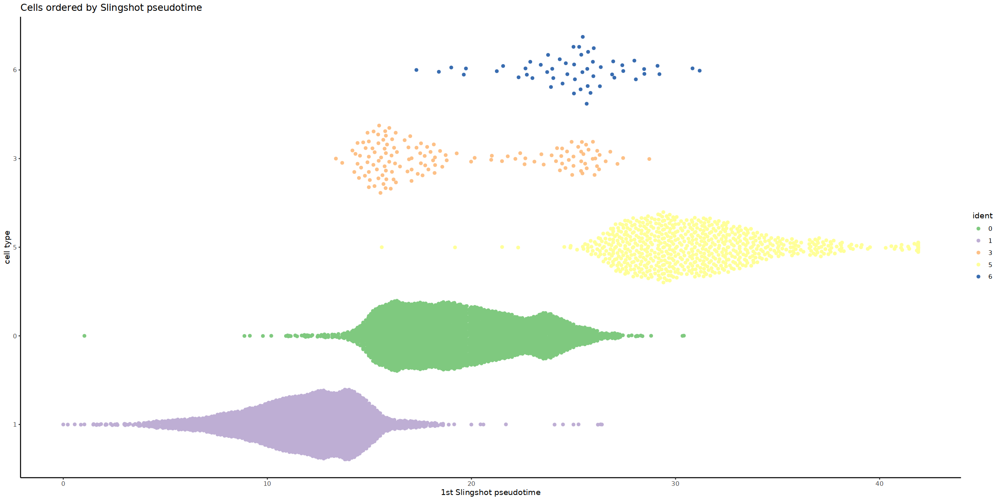

In [34]:
ggplot(df.sce, aes(x = slingPseudotime_1, y = reorder(ident,slingPseudotime_1), 
                              colour = ident)) +
    geom_quasirandom(groupOnX = FALSE) + theme_classic() +
    xlab("1st Slingshot pseudotime") + ylab("cell type") +
    ggtitle("Cells ordered by Slingshot pseudotime")+scale_color_brewer(type = "qual")

**cluster 1,0,5 as one of the lineage**
**cluster 1,0,3 as another lineage**
##### these are captured by pseudotime1

Warning message:
“Removed 2753 rows containing missing values (`position_quasirandom()`).”


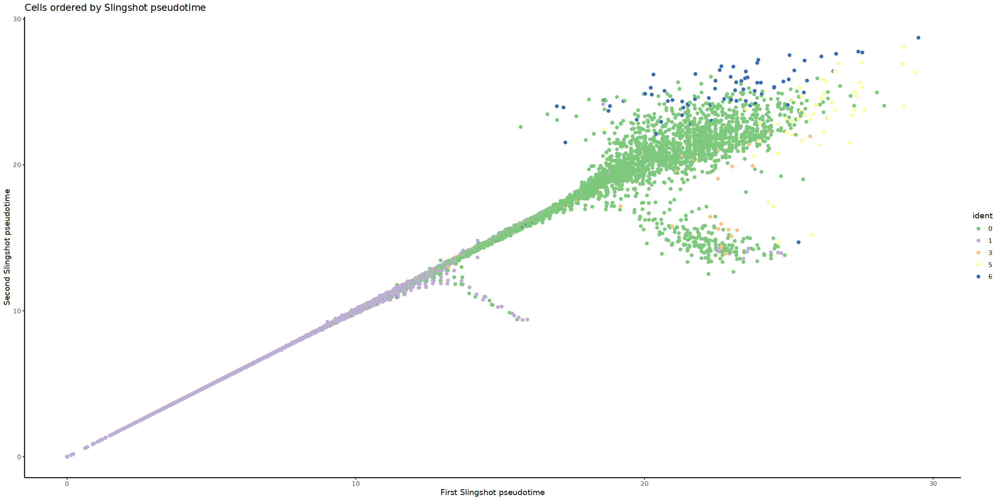

In [143]:
ggplot(df.sce, aes(x = slingPseudotime_1, y = slingPseudotime_2, 
                              colour = ident)) +
    geom_quasirandom(groupOnX = FALSE) + theme_classic() +
    xlab("First Slingshot pseudotime") + ylab("Second Slingshot pseudotime") +
    ggtitle("Cells ordered by Slingshot pseudotime")+scale_color_brewer(type = "qual")

In [144]:
#save.image("111123_slingshot.RData")

In [4]:
#load("./GSE134577-csf/111123_slingshot.RData")

The legacy packages maptools, rgdal, and rgeos, underpinning the sp package,
which was just loaded, will retire in October 2023.
Please refer to R-spatial evolution reports for details, especially
https://r-spatial.org/r/2023/05/15/evolution4.html.
It may be desirable to make the sf package available;
package maintainers should consider adding sf to Suggests:.
The sp package is now running under evolution status 2
     (status 2 uses the sf package in place of rgdal)



try to find which lineage is what 

In [13]:
#tiff(file="trajectoriescurves_111123.tif",width=4500,height=3000,res=400)
gg=plotUMAP(sce.sling2, colour_by = I(shared.pseudo))
embedded <- embedCurves(sce.sling2, "UMAP")
embedded <- slingCurves(embedded)



# Define color vector with hex codes
path_colors <- c("#000000", "#800000", "#000080")

# Loop through each path and add to the ggplot
for (i in seq_along(embedded)) {
    path <- embedded[[i]]
    path_df <- as.data.frame(path$s[path$ord,])
    gg <- gg + geom_path(data = path_df, aes(x = UMAP_1, y = UMAP_2), size = 1.2, color = path_colors[i])
}


gg <- gg + theme_minimal()  

gg
#dev.off()

png 
  2

In [27]:
set.seed(8)
#tiff(file="trajectoriescurves_onclust_111123.tif",width=4500,height=3000,res=400)
clustmap= plotUMAP(sce.sling2, colour_by=I(clustering))

for (i in seq_along(embedded)) {
    path <- embedded[[i]]
    path_df <- as.data.frame(path$s[path$ord,])
    clustmap <- clustmap + geom_path(data = path_df, aes(x = UMAP_1, y = UMAP_2), size = 1.2, color = path_colors[i])
}


clustmap <- clustmap + theme_minimal()  

clustmap
#dev.off()

png 
  2

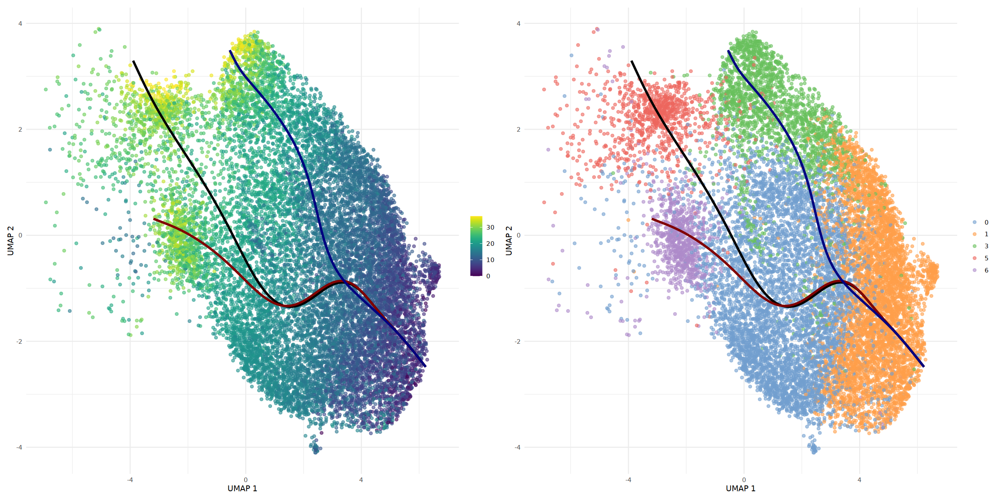

In [39]:
options(repr.plot.width = 20, repr.plot.height = 10)
gg|clustmap

first lineage is the black lineage 

In [65]:
set.seed(8)
newmap= plotUMAP(sce.sling2, colour_by=I(clustering))
em=embedCurves(sce.sling2, "UMAP")
sc=slingCurves(em)

In [98]:
em1=em[,c(1)]
sc1=sc[c(1)]
sc1=data.frame(sc1[[1]]$s[sc1[[1]]$ord,])
head(sc1)

,UMAP_1,UMAP_2
,<dbl>,<dbl>
MCI_MCI1_ATCACGATCTGCGTAA-1,6.227337,-2.483421
HC_HC8_AGGGAGTTCCGTCATC-1,6.198175,-2.463258
HC_HC3_CCGGTAGCATCACGTA-1,6.196332,-2.461984
AD_AD2_CAGGTGCTCTGTCAAG-1,6.193834,-2.460256
HC_HC3_AAGGCAGGTAGCAAAT-1,6.187435,-2.455832
AD_AD2_GAACCTAGTAGCTCCG-1,6.179914,-2.450633


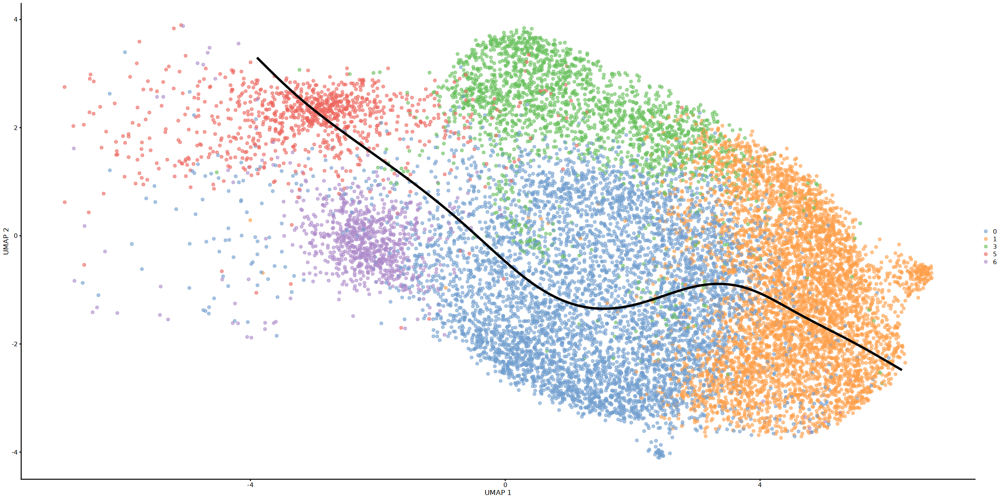

In [99]:
ln1=newmap + geom_path(data=sc1, aes(x=UMAP_1, y=UMAP_2), size=1.2)
ln1

2nd lineage

In [100]:
em1=em[,c(2)]
sc1=sc[c(2)]
sc1=data.frame(sc1[[1]]$s[sc1[[1]]$ord,])
head(sc1)
ln2=newmap + geom_path(data=sc1, aes(x=UMAP_1, y=UMAP_2), size=1.2)

,UMAP_1,UMAP_2
,<dbl>,<dbl>
MCI_MCI1_ATCACGATCTGCGTAA-1,6.227337,-2.483421
HC_HC8_AGGGAGTTCCGTCATC-1,6.198175,-2.463258
HC_HC3_CCGGTAGCATCACGTA-1,6.196332,-2.461984
AD_AD2_CAGGTGCTCTGTCAAG-1,6.193833,-2.460256
HC_HC3_AAGGCAGGTAGCAAAT-1,6.187434,-2.455832
AD_AD2_GAACCTAGTAGCTCCG-1,6.179919,-2.450636


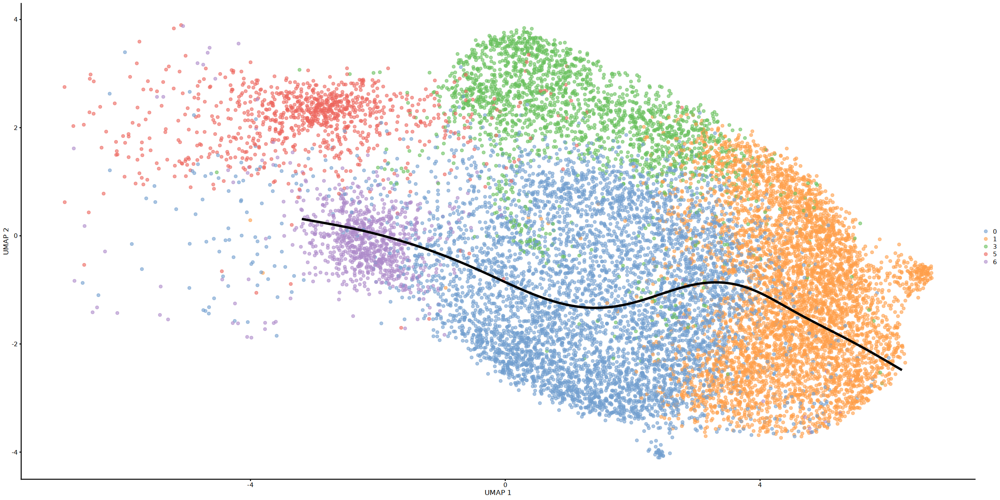

In [101]:
ln2

third lineage

In [102]:
em1=em[,c(3)]
sc1=sc[c(3)]
sc1=data.frame(sc1[[1]]$s[sc1[[1]]$ord,])
head(sc1)
ln3=newmap + geom_path(data=sc1, aes(x=UMAP_1, y=UMAP_2), size=1.2)

,UMAP_1,UMAP_2
,<dbl>,<dbl>
MCI_MCI1_ATCACGATCTGCGTAA-1,6.227335,-2.483420
HC_HC8_AGGGAGTTCCGTCATC-1,6.198175,-2.463258
HC_HC3_CCGGTAGCATCACGTA-1,6.196333,-2.461985
AD_AD2_CAGGTGCTCTGTCAAG-1,6.193835,-2.460257
HC_HC3_AAGGCAGGTAGCAAAT-1,6.187435,-2.455832
AD_AD2_GAACCTAGTAGCTCCG-1,6.179910,-2.450630


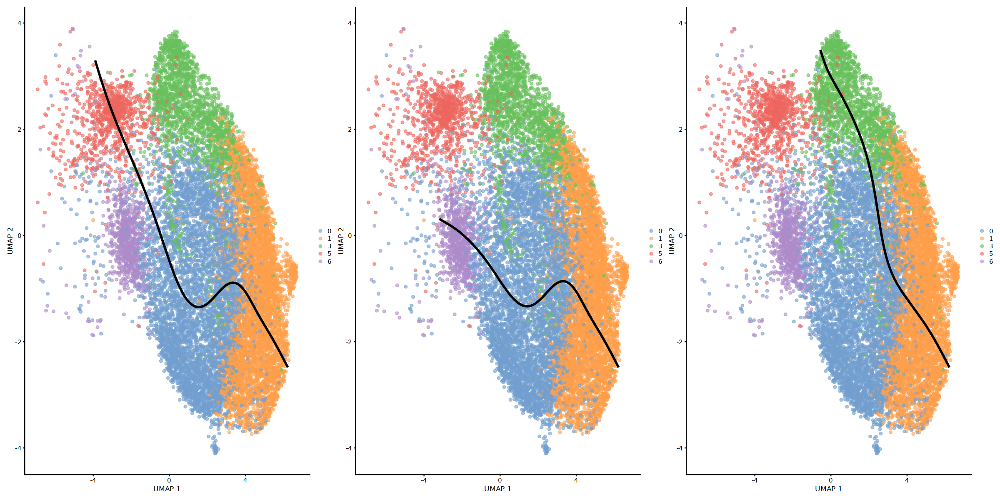

In [103]:
ln1|ln2|ln3